In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
import dlib

In [ ]:
#Import(read) the image and display it
image = cv2.imread('/content/people1.jpg')
display(image.shape)
#here 3 means its a coloured image(rgb image)

In [ ]:
#displays the pixels of the image
image

In [ ]:
#Display the image with Matplotlib
plt.imshow(image)
plt.show()

In [ ]:
#print image values - pixel values
print(image)

[[[ 91 103 107]
  [102 114 118]
  [ 92 107 110]
  ...
  [187 192 193]
  [186 191 192]
  [185 190 191]]

 [[ 93 105 109]
  [ 97 109 113]
  [ 95 110 113]
  ...
  [187 192 193]
  [186 191 192]
  [185 190 191]]

 [[ 96 111 114]
  [ 96 111 114]
  [102 117 120]
  ...
  [186 191 192]
  [185 190 191]
  [184 189 190]]

 ...

 [[ 48  43  40]
  [ 46  41  38]
  [ 44  39  36]
  ...
  [251 248 244]
  [252 247 244]
  [251 246 243]]

 [[ 55  49  44]
  [ 53  47  42]
  [ 49  43  38]
  ...
  [251 248 244]
  [252 247 244]
  [252 247 244]]

 [[ 56  50  45]
  [ 54  48  43]
  [ 50  44  39]
  ...
  [252 249 245]
  [253 248 245]
  [253 248 245]]]


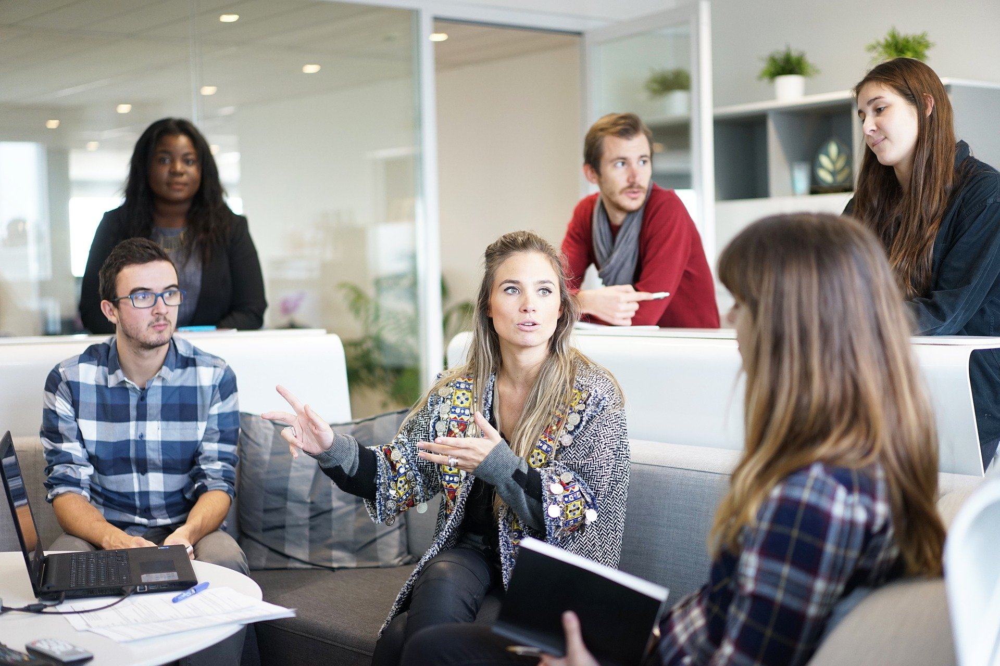

-1

In [ ]:
#Display the image with cv2
cv2_imshow(image)
cv2.waitKey(0)

In [ ]:
#resize the image
image = cv2.resize(image, (800,600))
image.shape

(600, 800, 3)

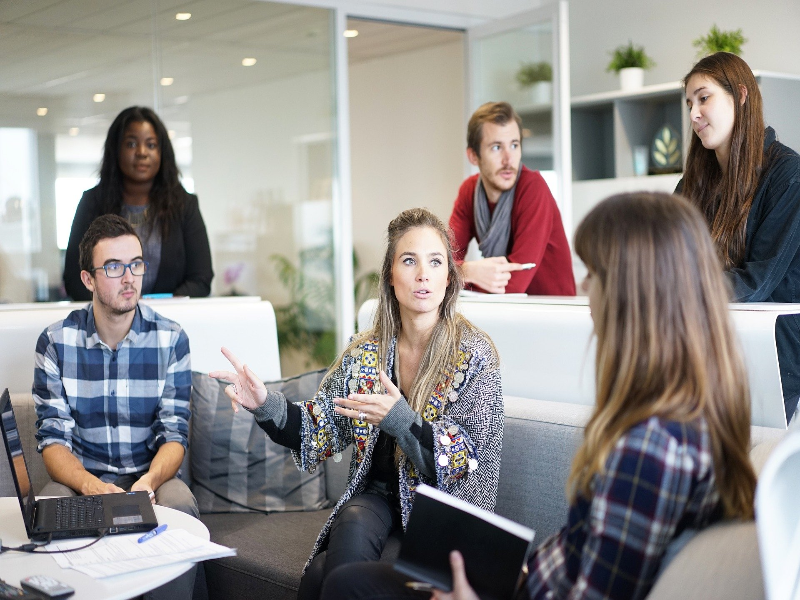

-1

In [ ]:
#display the small size image
cv2_imshow(image)
cv2.waitKey(0)

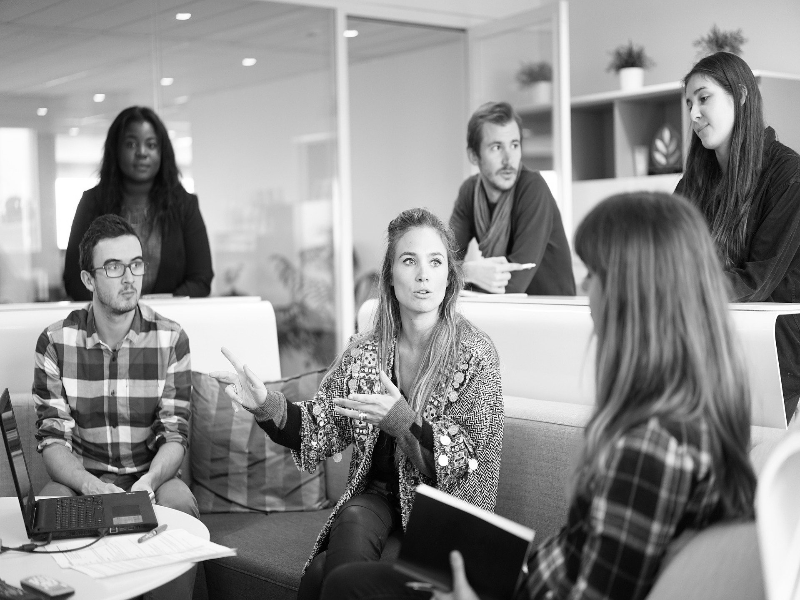

-1

In [ ]:
#Gray scale the image - convert to black and white
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)
cv2.waitKey(0)

In [ ]:
#Display the size of the grayscale image(b&w)
#One dimension has reduced - no colour dimension
display(image_gray.shape)

(600, 800)

###Cascade classifier
It is a machine learning-based approach where a cascade function is trained from a lot of positive and negative images. It is then used to detect objects in other images.

Cascading classifiers are trained with several hundred "positive" sample views of a particular object and arbitrary "negative" images of the same size. After the classifier is trained it can be applied to a region of an image and detect the object in question.


In [ ]:
#haarcascade_eye.xml detects the left and right eyes on the face
#haarcascade_frontalface_default.xml detects the feature of the face
#Load face detector .xml file

face_detector = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
face_detector

< cv2.CascadeClassifier 0x786f5a9cabd0>

In [ ]:
#detects the face in the black and white image that was generated above
'''each row for each face detected- the values in each row have the
coordinates such as "x", "y", "width", "height"'''
#The algo detects  6 faces, that is, 6 rows in the result

detections = face_detector.detectMultiScale(image_gray)
display(detections)

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
#Display the length- number of faces detected
display(len(detections))

6

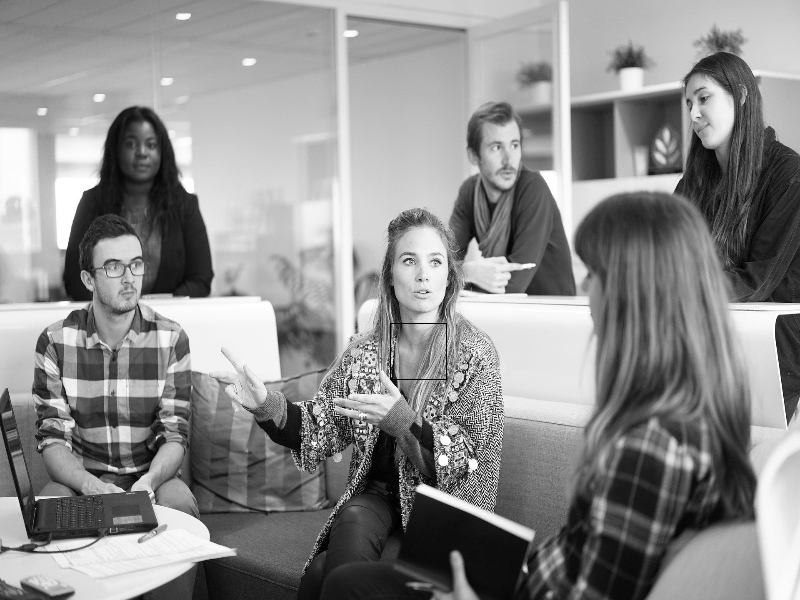

-1

In [ ]:
#display each detected face with rectangle
x = 390    # x-co ordinates
y = 323    # y-co ordinates
w = 56     # Face Width
h = 56     # Face Height

#Draw the rectangle with the co-ordinates specified above
#(0, 255, 255)-  This is RGB colour of rectangle
#1 is the thickness of rectangle

cv2.rectangle(image_gray, (x, y), (x+w, y+h), (0,255,255), 1)
cv2_imshow(image_gray)
cv2.waitKey(0)

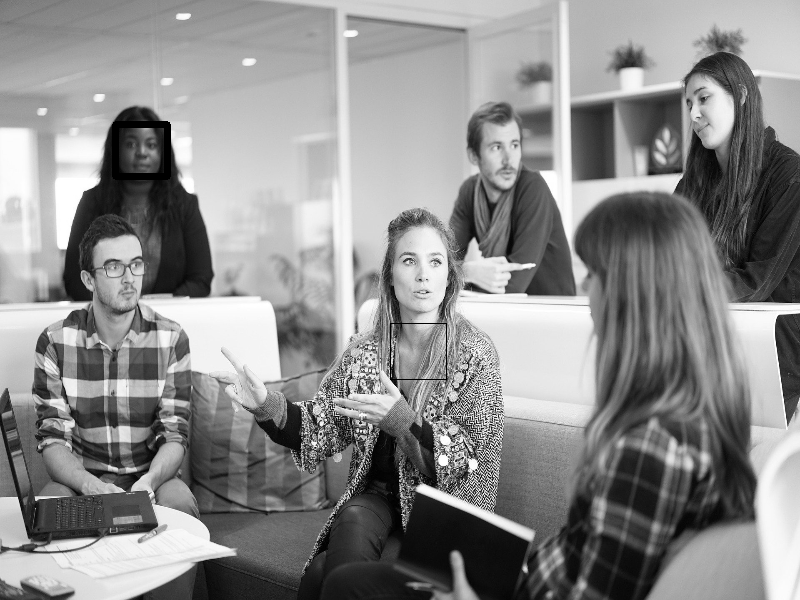

-1

In [ ]:
#Display second detected face with the rectangle
x = 115    # x-co ordinates
y = 124    # y-co ordinates
w = 52     # Face Width
h = 52     # Face Height

#Thickness is 5, i.e, thicker rectangle

cv2.rectangle(image_gray, (x, y), (x+w, y+h), (0,255,255), 5)
cv2_imshow(image_gray)
cv2.waitKey(0)

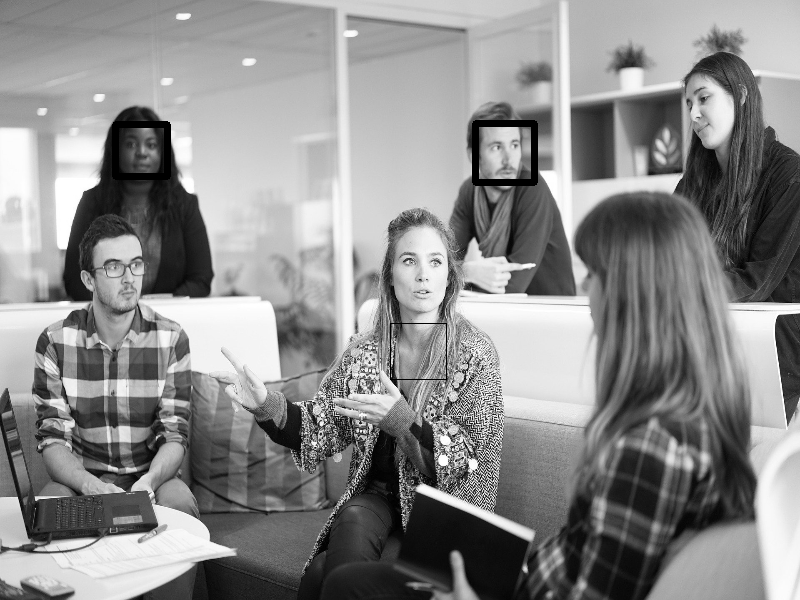

-1

In [ ]:
#Display thired detected face with rectangle
x = 475    # x-co ordinates
y = 123    # y-co ordinates
w = 59     # Face Width
h = 59     # Face Height

cv2.rectangle(image_gray, (x, y), (x+w, y+h), (0,255,255), 5)
cv2_imshow(image_gray)
cv2.waitKey(0)

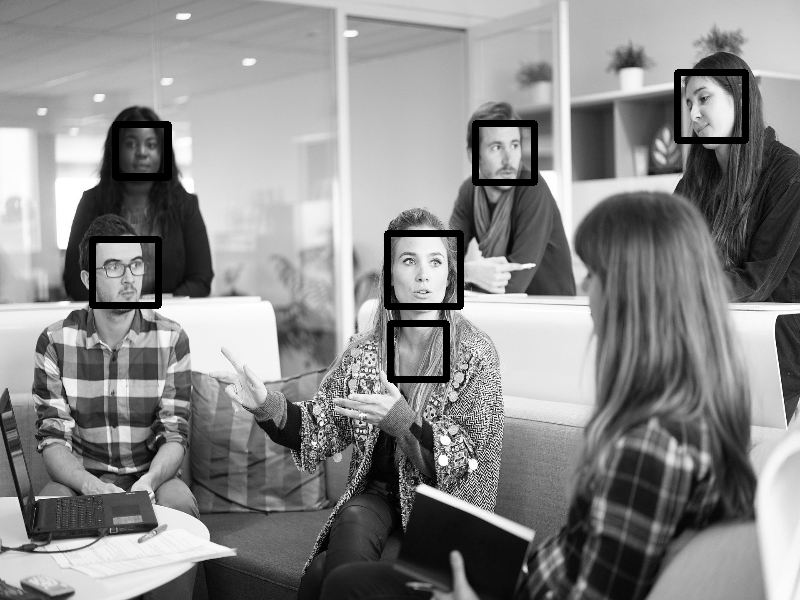

In [ ]:
#Use a for loop to display all the detected faces with rectangles
for(x, y, w, h) in detections:
  cv2.rectangle(image_gray, (x, y), (x+w, y+h), (0,255,255), 5)
cv2_imshow(image_gray)
cv2.waitKey(0)
plt.show()

In [ ]:
#Face Detection using a coloured image
image = cv2.imread('/content/people1.jpg')
display(image.shape)
image = cv2.resize(image, (800, 600))
display(image.shape)
detections = face_detector.detectMultiScale(image)
display(detections)

(1280, 1920, 3)

(600, 800, 3)

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

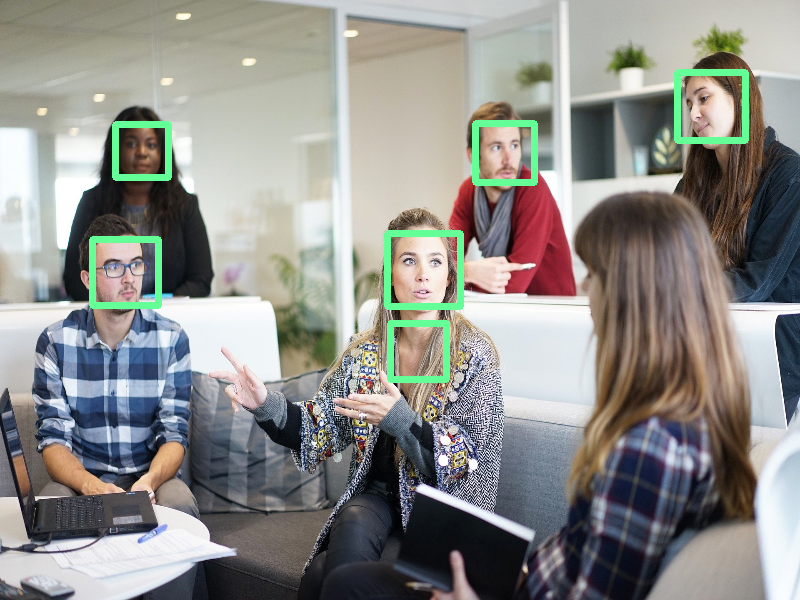

In [ ]:
#Display the image with detected faces
for(x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x+w, y+h), (150,255,100), 5)
cv2_imshow(image)
cv2.waitKey(0)
plt.show()

##Parameter- Scale Factor
The argumetn scaleFactor determines the factor by which the detection window of the classifier is scaled down per detection pass. A factor of 1.1 coresponds to an increase of 10%. Hence, increasing the scale factor increases performance, as the number of detection passes is reduced.

array([[678,  74,  65,  65],
       [113, 122,  56,  56],
       [475, 122,  60,  60],
       [386, 232,  74,  74],
       [ 90, 238,  69,  69]], dtype=int32)

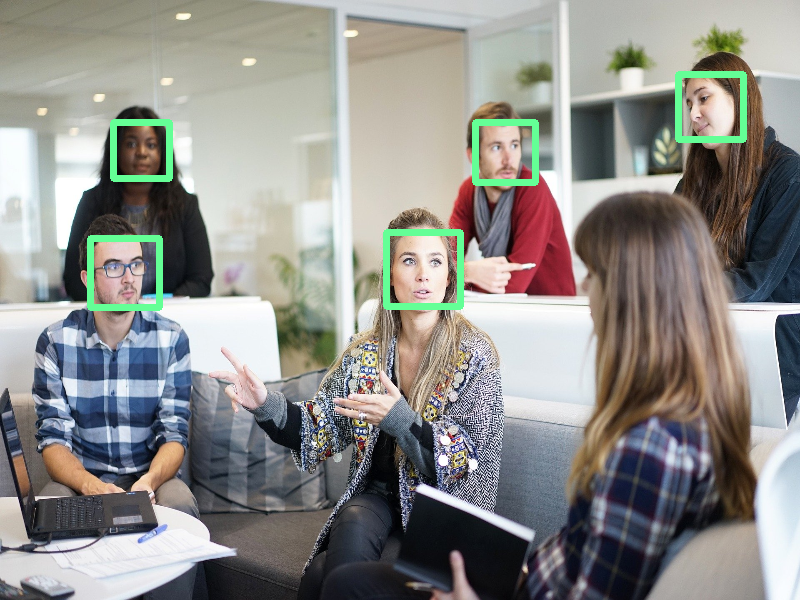

In [ ]:
image = cv2.imread('/content/people1.jpg')
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)
display(detections)
for(x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x+w, y+h), (150,255,100), 5)
cv2_imshow(image)
cv2.waitKey(0)
plt.show()

# Parameter- minNeighbours

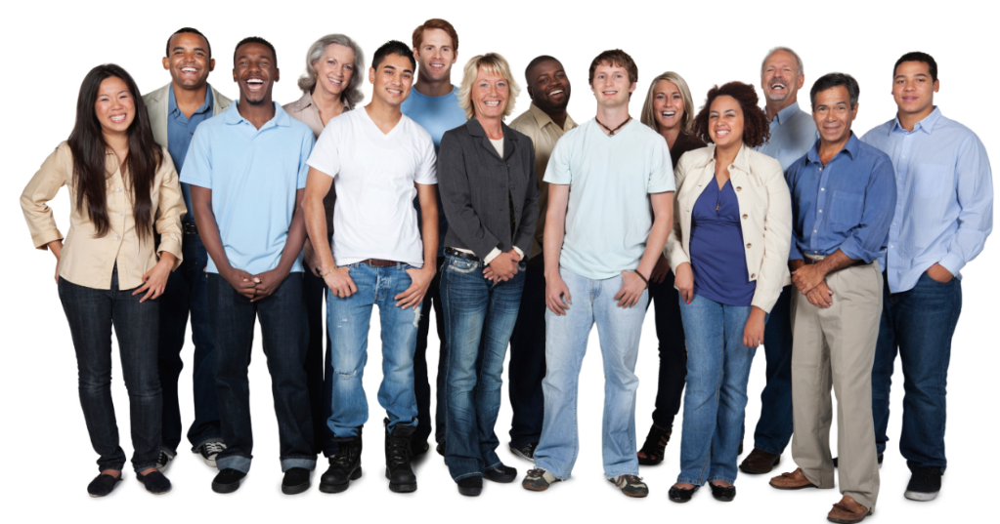

In [ ]:
#Load the image and display it
image = cv2.imread('/content/people2.jpg')
cv2_imshow(image)
cv2.waitKey(0)
plt.show()

array([[424,  32,  46,  46],
       [324,  49,  45,  45],
       [663,  83,  43,  43],
       [600,  61,  49,  49],
       [907,  63,  50,  50],
       [718, 101,  44,  44],
       [235,  45,  51,  51],
       [380,  53,  54,  54],
       [ 91,  81,  50,  50],
       [168,  35,  50,  50],
       [825,  90,  51,  51],
       [479,  69,  47,  47],
       [692, 153,  44,  44],
       [461, 367,  33,  33],
       [462, 378,  27,  27]], dtype=int32)

46 46
45 45
43 43
49 49
50 50
44 44
51 51
54 54
50 50
50 50
51 51
47 47
44 44
33 33
27 27


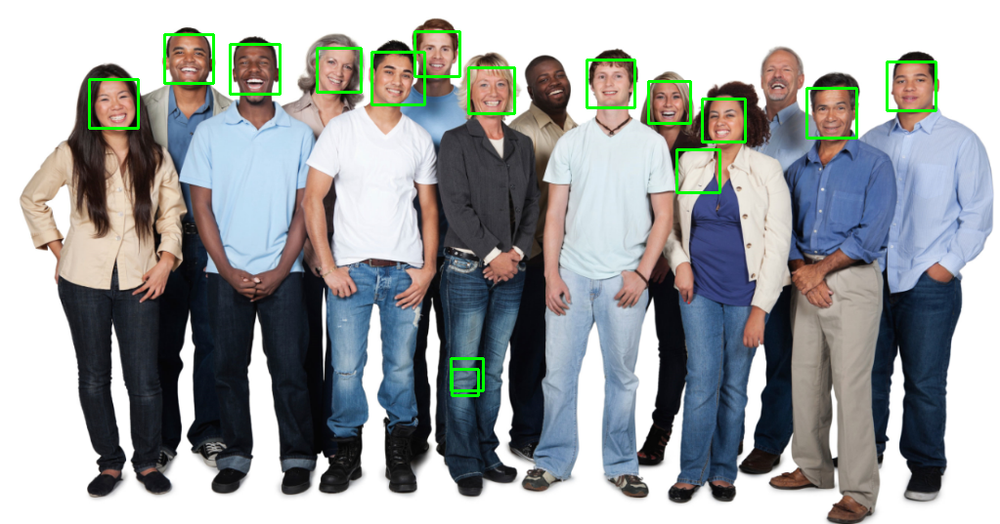

In [ ]:
#Face detections in the normal way- it has many false positives
image = cv2.imread('/content/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)
display(detections)
for(x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x+w, y+h), (0,255,0), 2)
cv2_imshow(image)
cv2.waitKey(0)
plt.show()

##Use parmeter- minNeighbors- It reduces False Positives

Parameter specifying how many neighbours each candidate rectangle should have to retain it. In other words, this parameter will affect the quality of the detected faces.
HIGHER VALUE RESULTS IN LESS DETECTIONS BUT WITH HIGHER QUALITY

array([[424,  31,  47,  47],
       [321,  48,  47,  47],
       [600,  60,  49,  49],
       [168,  35,  49,  49],
       [380,  54,  52,  52],
       [906,  63,  51,  51],
       [717, 100,  46,  46],
       [662,  83,  44,  44],
       [ 91,  81,  51,  51],
       [234,  46,  50,  50],
       [825,  91,  51,  51],
       [480,  70,  47,  47]], dtype=int32)

47 47
47 47
49 49
49 49
52 52
51 51
46 46
44 44
51 51
50 50
51 51
47 47


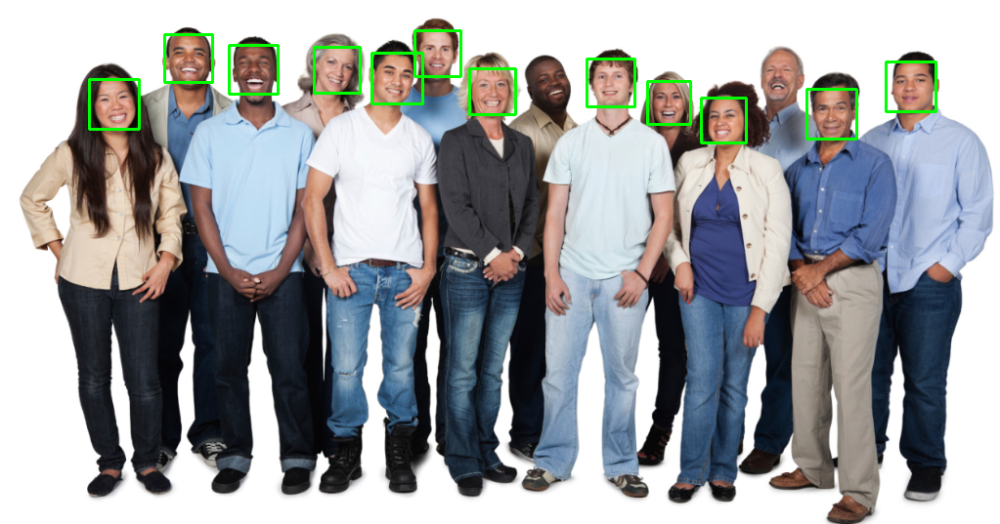

In [ ]:
image = cv2.imread('/content/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.2, minNeighbors=7)
display(detections)
for(x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x+w, y+h), (0,255,0), 2)
cv2_imshow(image)
cv2.waitKey(0)
plt.show()

In [ ]:
#....................................EYE DETEECTOR...................................
eye_detector = cv2.CascadeClassifier('/content/haarcascade_eye.xml')
display(eye_detector)

< cv2.CascadeClassifier 0x786f551e6590>

(1280, 1920, 3)

(1000, 1600, 3)

33 33
30 30
23 23
22 22
29 29
33 33
31 31
25 25
22 22


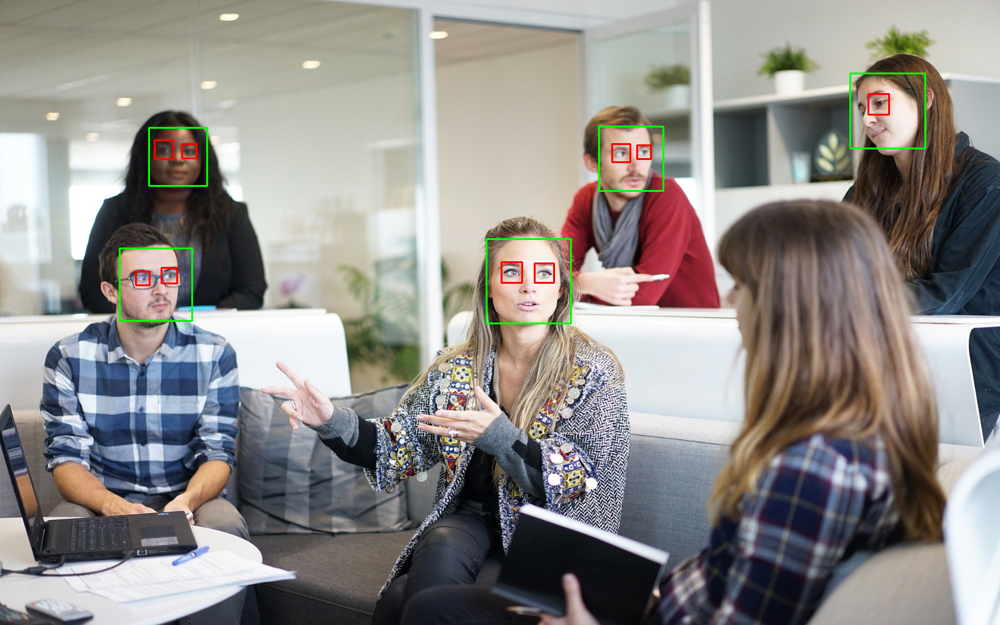

In [ ]:
#Use both eye detection and face detection
image = cv2.imread('/content/people1.jpg')
display(image.shape)
image = cv2.resize(image, (1600, 1000))
display(image.shape)
face_detections = face_detector.detectMultiScale(image, scaleFactor=1.3, minSize=(30,30))
for(x, y, w, h) in face_detections:
  cv2.rectangle(image, (x, y), (x+w, y+h), (0,255,0), 2)
eye_detections = eye_detector.detectMultiScale(image, scaleFactor=1.1, minNeighbors=10, maxSize=(60,60))
for(x, y, w, h) in eye_detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x+w, y+h), (0,0,255), 2)
cv2_imshow(image)
cv2.waitKey(0)
plt.show()